# Análisis exploratorio y clustering del proyecto

## Remesas vs migracion Guatemalteca 2011-2021

### Integrantes del proyecto

- Marco Pablo Orozco Saravia (20857)
- Yong Bum Park (20117)
- Santiago Taracena Puga (20017)
- Gabriel Alejandro Vicente Lorenzo (20498)


Para este proyecto se desea realizar un análisis exploratorio sobre una base de datos realizada a partir de varias fuentes confiables que nos proporciona el banco mundial y el banco de Guatemala, tratando de buscar una relación entre las remesas registradas en una década y la migración total del país vs a su población. Se planea que esta base se vuelva más robusta en medida que recursos se liberen a lo largo de estos días, cómo lo sería el Instituto Nacional de Estadística de Guatemala cuando su servidor vuelva.

A continuación se agregan los links de ciertos recursos utilizados

- https://datos.bancomundial.org/indicador/SP.POP.TOTL?locations=GT
- https://datos.bancomundial.org/indicator/SM.POP.NETM?end=2021&locations=GT&start=1960&view=chart
- https://www.ine.gob.gt/estadisticas-de-migracion/
- http://www.banguat.gob.gt/page/remesas-familiares-0

## Descripción de variables

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

df = pd.read_csv("datos_remesas_migracion_2011_2021_2.csv")

display(df.head()) 

,Anio,Enero_IMD,Febrero_IMD,Marzo_IMD,Abril_IMD,Mayo_IMD,Junio_IMD,Julio_IMD,Agosto_IMD,Septiembre_IMD,...,VIR,VNM,VUT,WLD,WSM,XKX,YEM,ZAF,ZMB,ZWE
0,2011.0,283.3,304.6,384.1,371.3,415.3,416.4,349.8,409.6,364.8,...,-1018.0,-4378.0,-934.0,0.0,-3246.0,-3033.0,-21770.0,65295.0,13605.0,-133434.0
1,2012.0,305.1,350.4,402.1,419.0,451.6,432.7,422.1,441.4,365.8,...,-932.0,-4545.0,-879.0,0.0,-3215.0,-15323.0,-20983.0,68846.0,9009.0,-66709.0
2,2013.0,357.9,351.2,424.1,451.2,477.0,417.2,445.8,456.3,420.7,...,-858.0,-4786.0,-824.0,0.0,-3182.0,-40468.0,-23747.0,63794.0,15574.0,-59918.0
3,2014.0,394.2,383.9,459.2,490.7,494.1,481.9,509.7,476.8,458.8,...,-748.0,-4875.0,-785.0,0.0,-3161.0,-56637.0,-30048.0,290874.0,16580.0,-59918.0
4,2015.0,407.4,432.0,556.5,503.8,519.0,536.3,573.7,527.3,538.4,...,-630.0,-4761.0,-756.0,0.0,-3137.0,-14819.0,-38355.0,644996.0,16283.0,-59918.0


In [7]:
# resumen estadístico
display(df.describe())

,Anio,Enero_IMD,Febrero_IMD,Marzo_IMD,Abril_IMD,Mayo_IMD,Junio_IMD,Julio_IMD,Agosto_IMD,Septiembre_IMD,...,VIR,VNM,VUT,WLD,WSM,XKX,YEM,ZAF,ZMB,ZWE
count,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,...,11.000000,11.000000,11.000000,11.0,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000
mean,2016.000000,534.690909,551.409091,654.763636,640.254545,689.654545,693.827273,700.045455,719.836364,674.363636,...,-574.818182,-3794.545455,-562.272727,0.0,-2607.909091,-26624.000000,-43754.454545,31709.272727,14788.363636,-61320.818182
std,3.316625,212.275196,207.921141,263.130972,248.746342,258.490740,294.155935,314.915641,315.241978,301.668839,...,305.149412,1264.106828,276.068503,0.0,847.114686,15352.899661,26093.497701,354290.349255,4057.827036,27469.568594
min,2011.000000,283.300000,304.600000,384.100000,371.300000,415.300000,416.400000,349.800000,409.600000,364.800000,...,-1018.000000,-4875.000000,-934.000000,0.0,-3246.000000,-56637.000000,-101468.000000,-866101.000000,9009.000000,-133434.000000
25%,2013.500000,376.050000,367.550000,441.650000,470.950000,485.550000,457.300000,477.750000,466.550000,439.750000,...,-803.000000,-4653.000000,-804.500000,0.0,-3171.500000,-33816.000000,-39734.000000,16831.000000,11310.000000,-59918.000000
50%,2016.000000,482.000000,558.000000,623.000000,609.300000,625.300000,614.700000,573.700000,619.200000,607.700000,...,-526.000000,-4378.000000,-404.000000,0.0,-2824.000000,-31383.000000,-39672.000000,30852.000000,16283.000000,-59918.000000
75%,2018.500000,661.350000,660.300000,750.650000,730.350000,822.650000,841.700000,883.050000,920.500000,819.150000,...,-458.000000,-3463.500000,-403.000000,0.0,-2604.000000,-15050.000000,-26897.500000,67070.500000,17652.000000,-59918.000000
max,2021.000000,906.800000,942.900000,1285.600000,1231.700000,1236.700000,1362.500000,1354.300000,1388.600000,1299.300000,...,0.000000,-992.000000,-197.000000,0.0,-882.000000,-3033.000000,-20983.000000,644996.000000,20268.000000,-25005.000000


In [8]:
import matplotlib.pyplot as plt


display("Número de filas:", df.shape[0])
display("Número de columnas:", df.shape[1])


display(df.isnull().any().loc[lambda x: x==True])


# df.hist(bins=20, figsize=(10,8))
# plt.show()


# display(df.corr())

'Número de filas:'

11

'Número de columnas:'

178

Autob�s de pasajeros    True
Autom�vil               True
Avi�n                   True
Bicicleta               True
Embarcaci�n             True
Sin transporte          True
Transporte de carga     True
Total                   True
INX                     True
dtype: bool

In [9]:
display(df["Autob�s de pasajeros"]) 

0           NaN
1           NaN
2           NaN
3           NaN
4           NaN
5     2113329.0
6     2338439.0
7     3496140.0
8     4091349.0
9     1476868.0
10          NaN
Name: Autob�s de pasajeros, dtype: float64

In [10]:
df.loc[2, "Autob�s de pasajeros"] = 584779.0
df.loc[3, "Autob�s de pasajeros"] = 1470711.0
df.loc[4, "Autob�s de pasajeros"] = 1897165.0
df.loc[10, "Autob�s de pasajeros"] = 1768373.0
df["Autob�s de pasajeros"].fillna(np.mean(df["Autob�s de pasajeros"]), inplace=True)

In [11]:
display(df['Autom�vil'])

0          NaN
1          NaN
2          NaN
3          NaN
4          NaN
5     707823.0
6     326594.0
7      42975.0
8      15806.0
9          8.0
10         NaN
Name: Autom�vil, dtype: float64

In [12]:
df.loc[2, "Autom�vil"] = 101533.0
df.loc[3, "Autom�vil"] = 507304.0
df.loc[4, "Autom�vil"] = 582624.0
df.loc[10, "Autom�vil"] = 57.0
df["Autom�vil"].fillna(np.mean(df["Autom�vil"]), inplace=True)

In [13]:
display(df['Avi�n'])

0           NaN
1           NaN
2           NaN
3           NaN
4           NaN
5     2588858.0
6     2663103.0
7     2858002.0
8     2899396.0
9      899700.0
10          NaN
Name: Avi�n, dtype: float64

In [14]:
df.loc[2, "Avi�n"] = 1990948.0
df.loc[3, "Avi�n"] = 2166134.0
df.loc[4, "Avi�n"] = 2334266.0
df.loc[10, "Avi�n"] = 2002058.0
df["Avi�n"].fillna(np.mean(df["Avi�n"]), inplace=True)

In [15]:
display(df['Bicicleta'])

0                  NaN
1                  NaN
2                  NaN
3                  NaN
4                  NaN
5              3092.00
6              1338.00
7                62.00
8                22.00
9                  -  
10                 NaN
Name: Bicicleta, dtype: object

In [16]:
df.loc[2, "Bicicleta"] = 35580.0
df.loc[3, "Bicicleta"] = 2295.0
df.loc[4, "Bicicleta"] = 2194.0
df.loc[9, "Bicicleta"] = np.nan
df['Bicicleta'] = df['Bicicleta'].fillna(0)
df['Bicicleta'] = df['Bicicleta'].astype(float)

media_bicicleta = df['Bicicleta'].mean()
df['Bicicleta'] = df['Bicicleta'].replace(0, media_bicicleta)

In [17]:
display(df['Embarcaci�n '])

0         NaN
1         NaN
2         NaN
3         NaN
4         NaN
5     19821.0
6     14591.0
7      7929.0
8     10914.0
9      5660.0
10        NaN
Name: Embarcaci�n , dtype: float64

In [18]:
df.loc[2, "Embarcaci�n "] = 24735.0
df.loc[3, "Embarcaci�n "] = 23785.0
df.loc[4, "Embarcaci�n "] = 20344.0
df.loc[10, "Embarcaci�n "] = 6035.0
df["Embarcaci�n "].fillna(np.mean(df["Embarcaci�n "]), inplace=True)

In [19]:
display(df['Sin transporte'])

0           NaN
1           NaN
2           NaN
3           NaN
4           NaN
5     1456572.0
6     2352923.0
7     2344022.0
8     2481634.0
9      646470.0
10          NaN
Name: Sin transporte, dtype: float64

In [20]:
df.loc[2, "Sin transporte"] = 427772.0
df.loc[3, "Sin transporte"] = 651421.0
df.loc[4, "Sin transporte"] = 957204.0
df.loc[10, "Sin transporte"] = 1106466.0
df["Sin transporte"].fillna(np.mean(df["Sin transporte"]), inplace=True)

In [21]:
display(df['Transporte de carga'])

0                    NaN
1                    NaN
2                    NaN
3                    NaN
4                    NaN
5              111487.00
6               33386.00
7                  22.00
8                   4.00
9                    -  
10                   NaN
Name: Transporte de carga, dtype: object

In [22]:
df.loc[2, "Transporte de carga"] = 152125.0
df.loc[3, "Transporte de carga"] = 133075.0
df.loc[4, "Transporte de carga"] = 160300.0
df.loc[9,"Transporte de carga"] = float(np.nan)
df['Transporte de carga'] = df['Transporte de carga'].fillna(0)
df['Transporte de carga'] = df['Transporte de carga'].astype(float)

media_Transporte_de_carga = df['Transporte de carga'].mean()
df['Transporte de carga'] = df['Transporte de carga'].replace(0, media_Transporte_de_carga)

In [23]:
display(df['Total'])

0           NaN
1           NaN
2           NaN
3           NaN
4           NaN
5     7000981.0
6     7730374.0
7     8749152.0
8     9499125.0
9     3028706.0
10          NaN
Name: Total, dtype: float64

In [24]:
display(df['INX'])

0    NaN
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
Name: INX, dtype: float64

In [25]:
# Obtener el número total de valores en la columna INX
inx_count = df["INX"].count()

# Obtener el número total de valores en toda la base de datos
total_count = df.size

# Calcular el porcentaje
percent = inx_count / total_count * 100

print("La columna INX representa {:.2f}% de toda la base de datos.".format(percent))


La columna INX representa 0.00% de toda la base de datos.


In [26]:
df = df.drop("INX", axis=1)

In [189]:
from ydata_profiling import ProfileReport
data = df.loc[:, ["Anio", "Enero_IMD", "Febrero_IMD", "Marzo_IMD", "Abril_IMD", "Mayo_IMD", "Junio_IMD", "Julio_IMD", "Agosto_IMD", "Septiembre_IMD", "Octubre_IMD", "Noviembre_IMD", "Diciembre_IMD", "Total_IMD"]]

profile = ProfileReport(data, title='Informe de perfil de datos', explorative=True)
profile

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]


In [190]:
data = df.loc[:, ["Anio", "Enero_VPA", "Febrero_VPA", "Marzo_VPA", "Abril_VPA", "Mayo_VPA", "Junio_VPA", "Julio_VPA", "Agosto_VPA", "Septiembre_VPA", "Octubre_VPA", "Noviembre_VPA", "Diciembre_VPA"]]


profile = ProfileReport(data, title='Informe de perfil de datos', explorative=True)
profile

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


In [191]:
data = df.loc[:, ["Anio", "Enero_IMD", "Febrero_IMD", "Marzo_IMD", "Abril_IMD", "Mayo_IMD", "Junio_IMD", "Julio_IMD", "Agosto_IMD", "Septiembre_IMD", "Octubre_IMD", "Noviembre_IMD", "Diciembre_IMD", "Total_IMD"]]


sns.pairplot(data)

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x0000000021BE1360> (for post_execute):


KeyboardInterrupt: 

<AxesSubplot:>

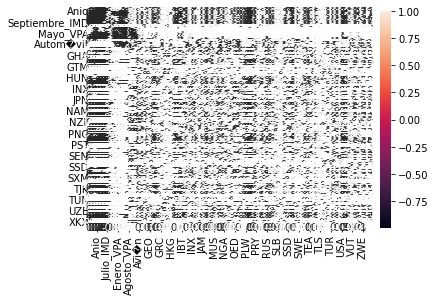

In [ ]:
sns.heatmap(df.corr(), annot = True) 

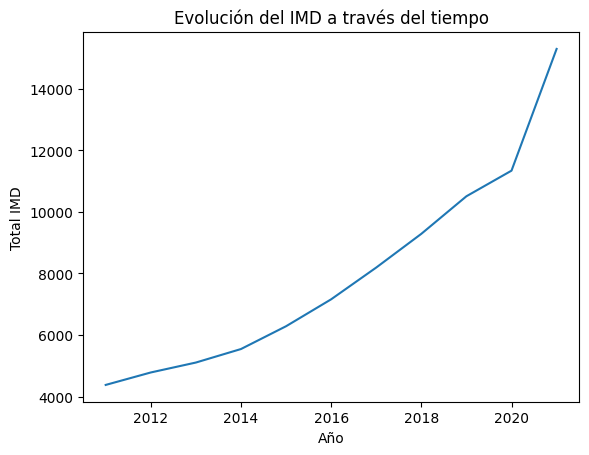

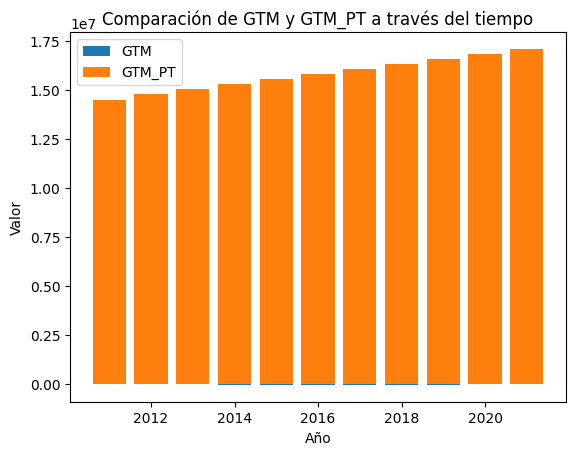

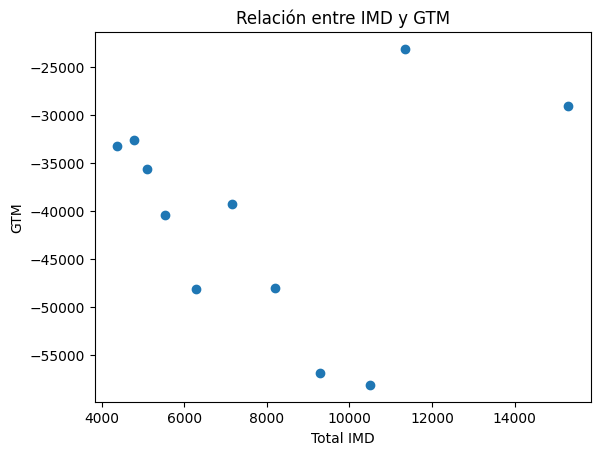

In [27]:
import matplotlib.pyplot as plt

plt.plot(df['Anio'], df['Total_IMD'])
plt.xlabel('Año')
plt.ylabel('Total IMD')
plt.title('Evolución del IMD a través del tiempo')
plt.show()

plt.bar(df['Anio'], df['GTM'], label='GTM')
plt.bar(df['Anio'], df['GTM_PT'], label='GTM_PT')
plt.xlabel('Año')
plt.ylabel('Valor')
plt.title('Comparación de GTM y GTM_PT a través del tiempo')
plt.legend()
plt.show()

plt.scatter(df['Total_IMD'], df['GTM'])
plt.xlabel('Total IMD')
plt.ylabel('GTM')
plt.title('Relación entre IMD y GTM')
plt.show()


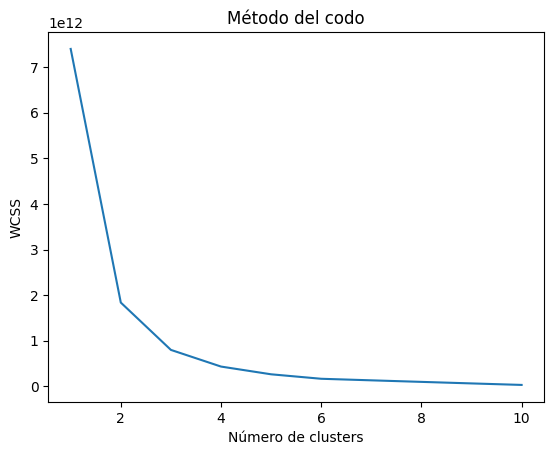

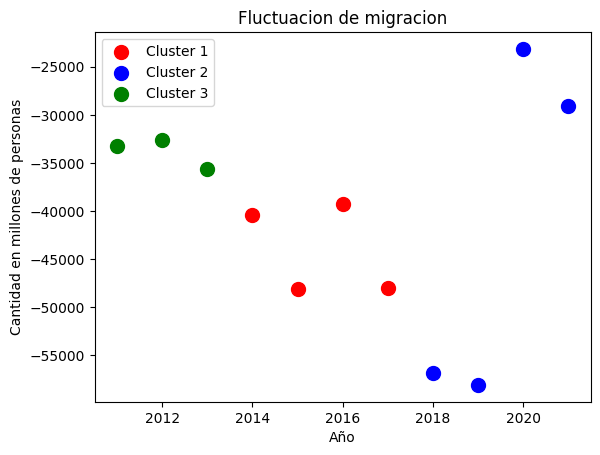

In [28]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Seleccionar las columnas para el clustering
data = df.loc[:, ["Anio", "Enero_IMD", "Febrero_IMD", "Marzo_IMD", "Abril_IMD", "Mayo_IMD", "Junio_IMD", "Julio_IMD", "Agosto_IMD", "Septiembre_IMD", "Octubre_IMD", "Noviembre_IMD", "Diciembre_IMD", "Total_IMD", "Enero_VPA", "Febrero_VPA", "Marzo_VPA", "Abril_VPA", "Mayo_VPA", "Junio_VPA", "Julio_VPA", "Agosto_VPA", "Septiembre_VPA", "Octubre_VPA", "Noviembre_VPA", "Diciembre_VPA", "GTM_PT", "GTM"]]

# Encontrar el número óptimo de clusters
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(data)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('Método del codo')
plt.xlabel('Número de clusters')
plt.ylabel('WCSS')
plt.show()

# Entrenar el modelo de k-means con el número óptimo de clusters
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(data)

# Agregar los resultados del clustering al DataFrame original
df['cluster'] = pred_y

# Visualizar los resultados del clustering
# Visualizar los resultados del clustering
plt.scatter(data[pred_y == 0]['Anio'], data[pred_y == 0]['GTM'], s=100, c='red', label='Cluster 1')
plt.scatter(data[pred_y == 1]['Anio'], data[pred_y == 1]['GTM'], s=100, c='blue', label='Cluster 2')
plt.scatter(data[pred_y == 2]['Anio'], data[pred_y == 2]['GTM'], s=100, c='green', label='Cluster 3')
# plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='yellow', label='Centroides')
plt.title('Fluctuacion de migracion')
plt.xlabel('Año')
plt.ylabel('Cantidad en millones de personas')
plt.legend()
plt.show()


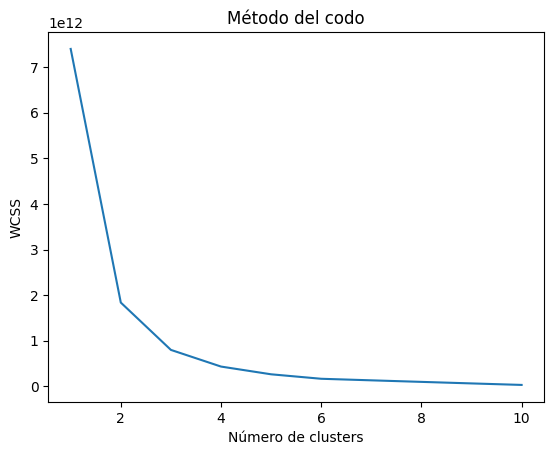

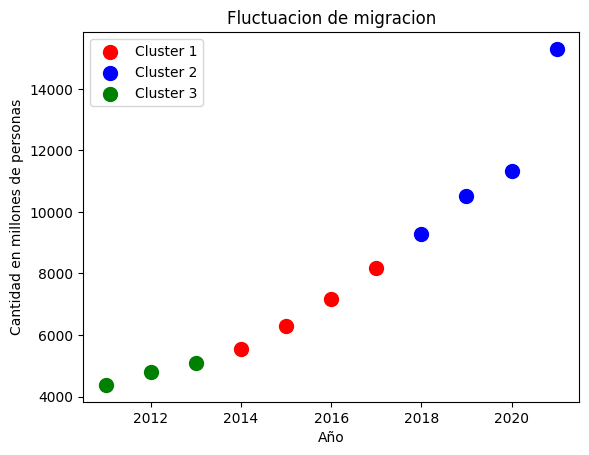

In [30]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Seleccionar las columnas para el clustering
data = df.loc[:, ["Anio", "Enero_IMD", "Febrero_IMD", "Marzo_IMD", "Abril_IMD", "Mayo_IMD", "Junio_IMD", "Julio_IMD", "Agosto_IMD", "Septiembre_IMD", "Octubre_IMD", "Noviembre_IMD", "Diciembre_IMD", "Total_IMD", "Enero_VPA", "Febrero_VPA", "Marzo_VPA", "Abril_VPA", "Mayo_VPA", "Junio_VPA", "Julio_VPA", "Agosto_VPA", "Septiembre_VPA", "Octubre_VPA", "Noviembre_VPA", "Diciembre_VPA", "GTM_PT", "GTM"]]

# Encontrar el número óptimo de clusters
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(data)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('Método del codo')
plt.xlabel('Número de clusters')
plt.ylabel('WCSS')
plt.show()

# Entrenar el modelo de k-means con el número óptimo de clusters
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(data)

# Agregar los resultados del clustering al DataFrame original
df['cluster'] = pred_y

# Visualizar los resultados del clustering
# Visualizar los resultados del clustering
plt.scatter(data[pred_y == 0]['Anio'], data[pred_y == 0]['Total_IMD'], s=100, c='red', label='Cluster 1')
plt.scatter(data[pred_y == 1]['Anio'], data[pred_y == 1]['Total_IMD'], s=100, c='blue', label='Cluster 2')
plt.scatter(data[pred_y == 2]['Anio'], data[pred_y == 2]['Total_IMD'], s=100, c='green', label='Cluster 3')
# plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='yellow', label='Centroides')
plt.title('Fluctuacion de migracion')
plt.xlabel('Año')
plt.ylabel('Cantidad en millones de personas')
plt.legend()
plt.show()



In [31]:
from sklearn.metrics import silhouette_score

# Calcular la silueta media para el modelo de clustering
silhouette_avg = silhouette_score(data, pred_y)
print("La silueta media para el modelo de clustering es:", silhouette_avg)

La silueta media para el modelo de clustering es: 0.4851043892284602


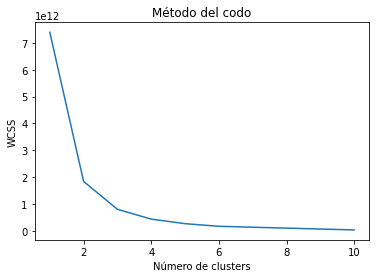

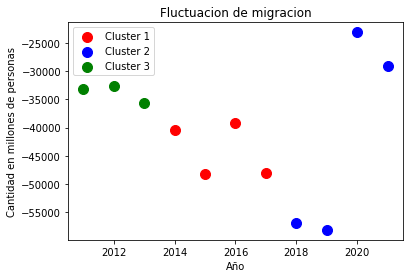

In [30]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Seleccionar las columnas para el clustering
data = df.loc[:, ["Anio", "Enero_IMD", "Febrero_IMD", "Marzo_IMD", "Abril_IMD", "Mayo_IMD", "Junio_IMD", "Julio_IMD", "Agosto_IMD", "Septiembre_IMD", "Octubre_IMD", "Noviembre_IMD", "Diciembre_IMD", "Total_IMD", "Enero_VPA", "Febrero_VPA", "Marzo_VPA", "Abril_VPA", "Mayo_VPA", "Junio_VPA", "Julio_VPA", "Agosto_VPA", "Septiembre_VPA", "Octubre_VPA", "Noviembre_VPA", "Diciembre_VPA", "GTM_PT", "GTM"]]

# Encontrar el número óptimo de clusters
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(data)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('Método del codo')
plt.xlabel('Número de clusters')
plt.ylabel('WCSS')
plt.show()

# Entrenar el modelo de k-means con el número óptimo de clusters
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(data)

# Agregar los resultados del clustering al DataFrame original
df['cluster'] = pred_y

# Visualizar los resultados del clustering
# Visualizar los resultados del clustering
plt.scatter(data[pred_y == 0]['Anio'], data[pred_y == 0]['GTM'], s=100, c='red', label='Cluster 1')
plt.scatter(data[pred_y == 1]['Anio'], data[pred_y == 1]['GTM'], s=100, c='blue', label='Cluster 2')
plt.scatter(data[pred_y == 2]['Anio'], data[pred_y == 2]['GTM'], s=100, c='green', label='Cluster 3')
# plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='yellow', label='Centroides')
plt.title('Fluctuacion de migracion')
plt.xlabel('Año')
plt.ylabel('Cantidad en millones de personas')
plt.legend()
plt.show()

